In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

In [2]:
excel_file = pd.ExcelFile('_imports/Wasaga CS5 bundle data_raw_Uwe_mod.xlsx')
sheet_names = [n for n in excel_file.sheet_names if n[:3]in ['Nov','Dec','Apr']] 


raw_data = {}

for sheet in sheet_names:
    df0 = pd.read_excel('_imports/Wasaga CS5 bundle data_raw_Uwe_mod.xlsx',
                                    sheet_name=sheet,header=0,skiprows=[1])
    #df0.columns = df0.columns.map('|'.join).str.strip('|')
    df0 = df0[~df0['Sample'].isna()]
    df0 = df0[~df0['x'].isna()]
    raw_data[sheet] = df0

ImportError: Missing optional dependency 'openpyxl'.  Use pip or conda to install openpyxl.

## Integrate whole cross section

In [ ]:
contour_dict = {}
for parm in ['SRP', 'NH4-N','Cl','NO3','SO4']:
    # vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    # vmin = 0
    # vmax = np.nanpercentile([np.nanmax(raw_data[key][parm]) for key in raw_data.keys()],100)

    grid_zs ={}
    contour_dict[parm] = grid_zs
    #fig,axes = plt.subplots(3,3)
    # n = 0
    for sheet in sheet_names:
        df1 = raw_data[sheet].copy()
        df1 = df1[~df1[parm].isna()]
        xs = df1['x']
        ys = df1['y']
        zs = df1[parm]
        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = griddata((xs, ys), zs, (grid_x, grid_y), method='linear')
        grid_zs[sheet] = grid_z



grid_zs = {}
contour_dict['SRP - NH4-N']  = grid_zs
for key in contour_dict['SRP'].keys():
    grid_zs[key]= contour_dict['SRP'][key] - contour_dict['NH4-N'][key]*200

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/2422455356.py:47: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


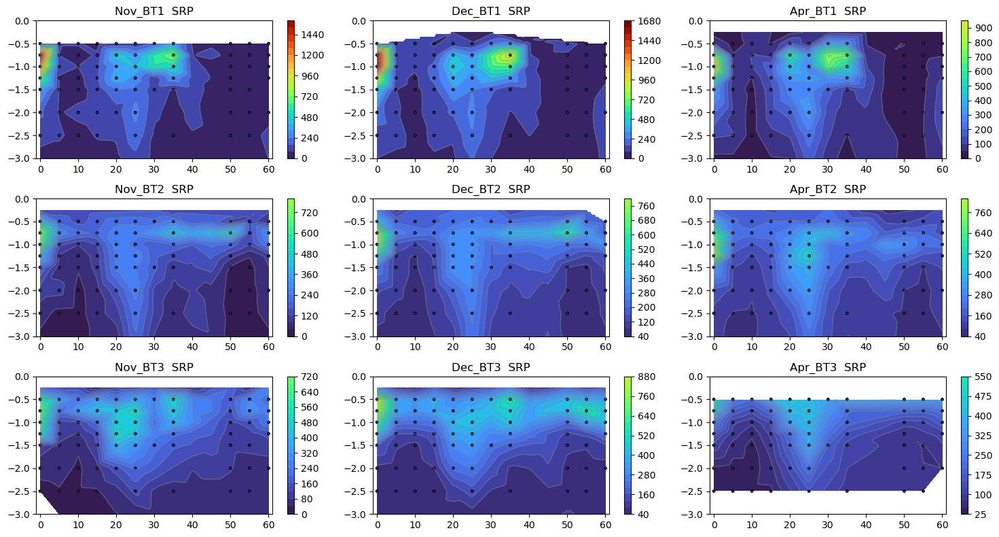

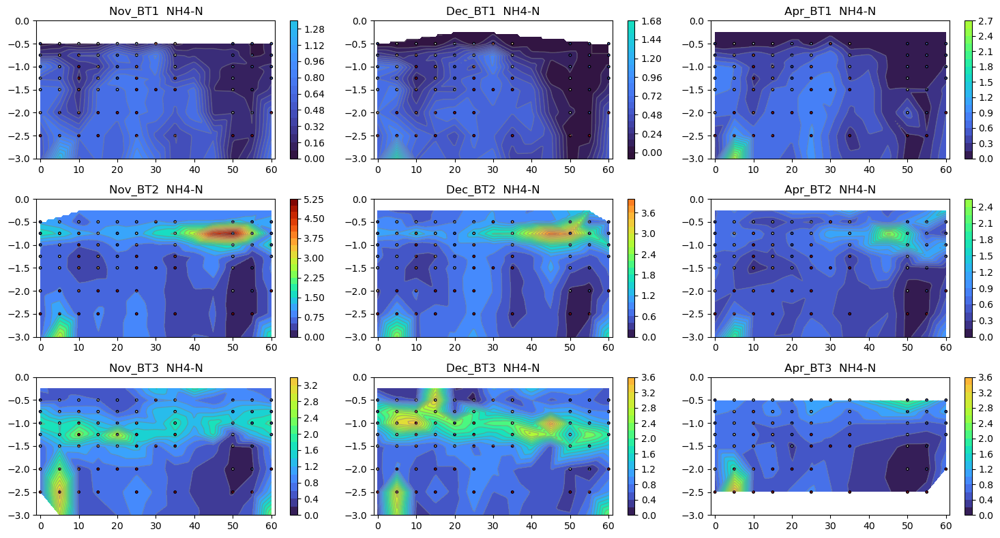

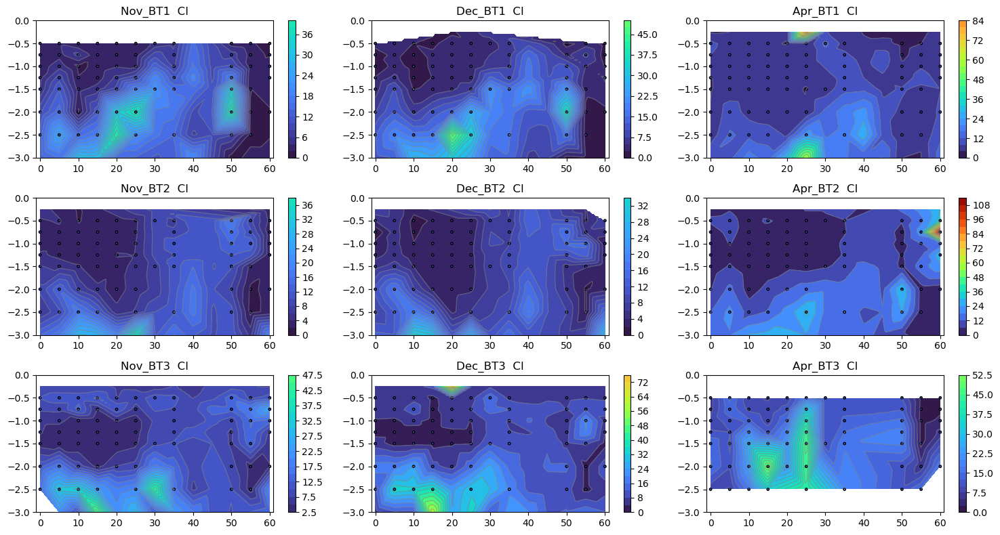

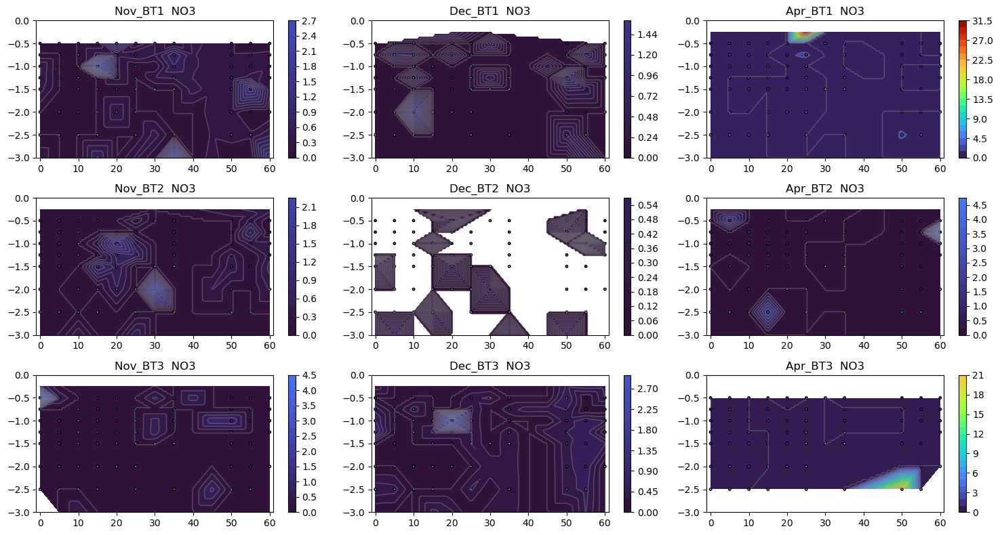

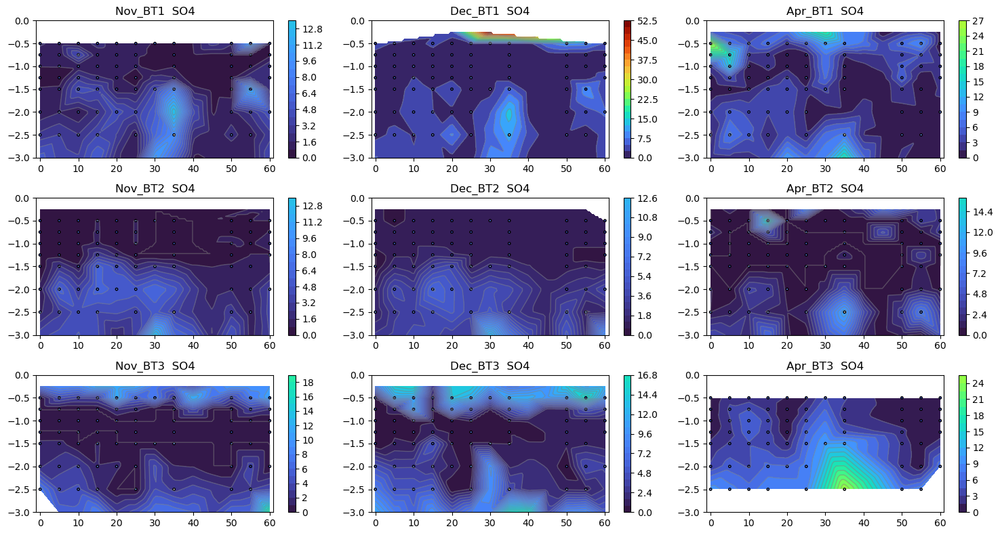

In [ ]:




#contour_dict = {}

for parm in ['SRP', 'NH4-N','Cl','NO3','SO4']:
    n = 0
    vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax = np.nanpercentile([np.nanmax(raw_data[key][parm]) for key in raw_data.keys()],100)

    fig,axes = plt.subplots(3,3)

    for sheet in sheet_names:
        # df1 = raw_data[sheet].copy()
        # df1 = df1[~df1[parm].isna()]
        # xs = df1['x']
        # ys = df1['y']
        # zs = df1[parm]


        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]
        #grid_zs[sheet] = grid_z


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=20,vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        fig.colorbar(contour,ax=ax)

        ax.set_title('{}  {}'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

    ##---------------------------------------

    

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/3370617487.py:71: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


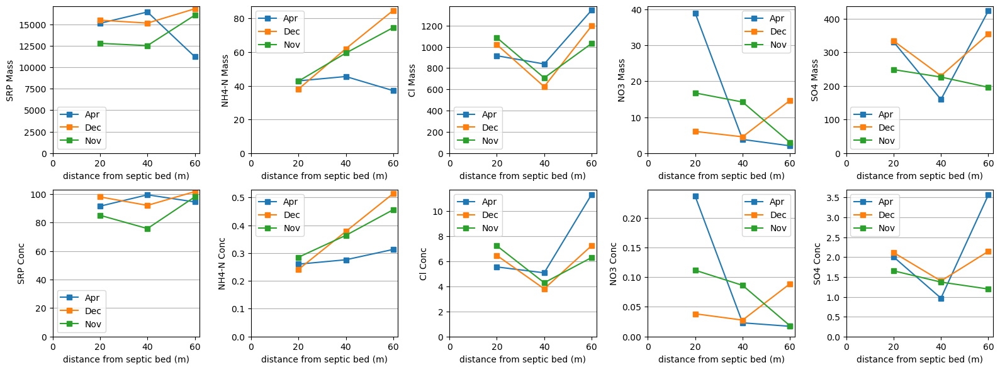

In [ ]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,5)
n2 = 0


for parm in ['SRP', 'NH4-N','Cl','NO3','SO4']:

    grid_zs = contour_dict[parm]
    ##-----------------------mass----------------
    ax = ax2.flatten()[n2]

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))

    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+5]
    #n2 +=1

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(16,6)
fig2.tight_layout()
fig2.show()
    

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/3441066695.py:41: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


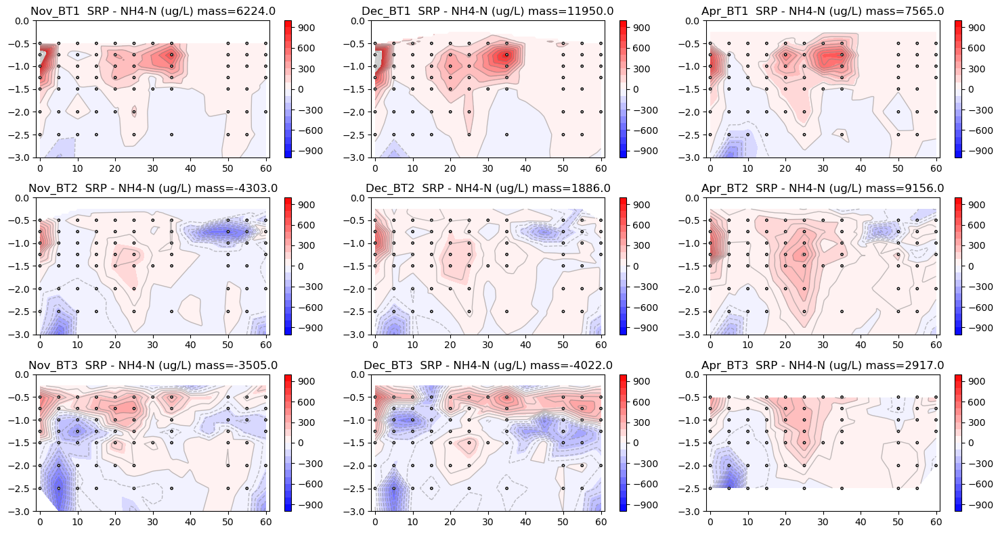

In [ ]:
for parm in ['SRP - NH4-N']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = -1000
    vmax =1000


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='bwr',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        plt.colorbar(contour,ax=ax,extend='neither')
        
        mass = round(np.nansum(grid_z)*0.025,0)
        ax.set_title('{}  {} (ug/L) mass={}'.format(sheet,parm,mass))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/1361637251.py:71: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


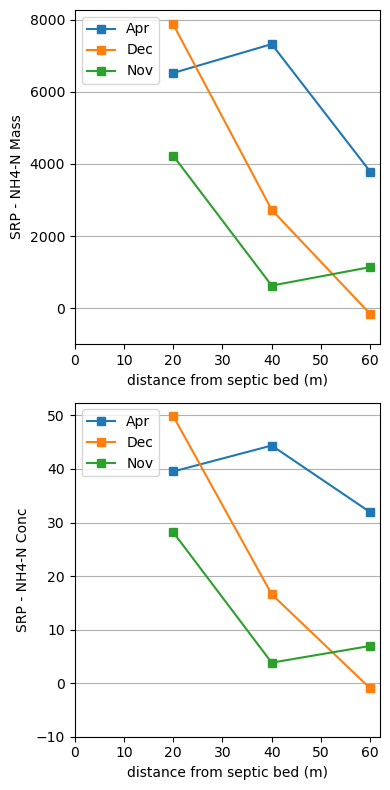

In [ ]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,1)
n2 = 0


for parm in ['SRP - NH4-N']:

    grid_zs = contour_dict[parm]
    ##-----------------------mass----------------
    ax = ax2.flatten()[n2]

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(-1000)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))

    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+1]
    #n2 +=1

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(-10)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(4,8)
fig2.tight_layout()
fig2.show()
    

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/3121874137.py:138: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


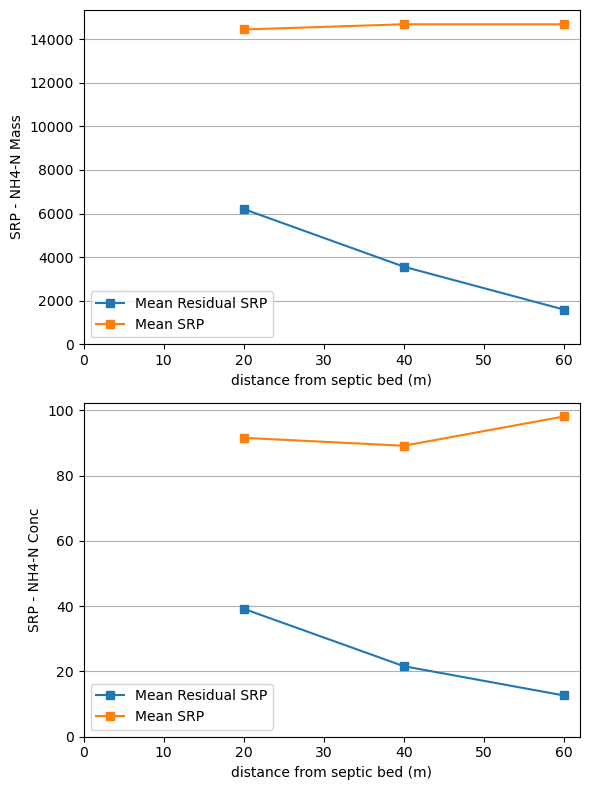

In [33]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,1)
n2 = 0


for parm in ['SRP - NH4-N']:
    y1s = []
    y2s = []
    y3s = []
    grid_zs = contour_dict[parm]
    ##-----------------------mass----------------
    ax = ax2.flatten()[n2]

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)
        y1s.append(y1)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)
        y2s.append(y2)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)
        y3s.append(y3)
    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean Residual SRP')


    grid_zs = contour_dict['SRP']
    ##-----------------------mass----------------
    y1s = []
    y2s = []
    y3s = []

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)
        y1s.append(y1)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)
        y2s.append(y2)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)
        y3s.append(y3)
    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean SRP')


    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))


    grid_zs = contour_dict[parm]
    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+1]
    #n2 +=1
    y1s = []
    y2s = []
    y3s = []
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        y1s.append(y1)
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area
        y2s.append(y2)


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area
        y3s.append(y3)


    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean Residual SRP')

    grid_zs = contour_dict['SRP']
    ## ---------- Concentration ----------
        #n2 +=1
    y1s = []
    y2s = []
    y3s = []
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        y1s.append(y1)
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area
        y2s.append(y2)


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area
        y3s.append(y3)

    
    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean SRP')
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(6,8)
fig2.tight_layout()
fig2.show()
    

C:\Users\swan47\AppData\Local\Temp\ipykernel_10864\3319309049.py:43: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


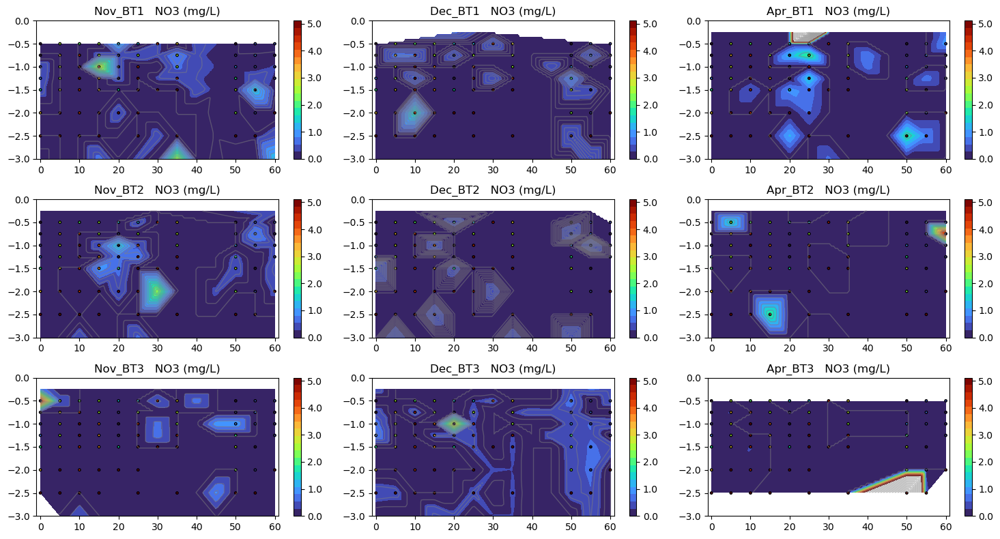

In [34]:
for parm in ['NO3']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = -0.01
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])
    vmax = 5


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax+0.1,20),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='turbo', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 0.1, 1))
        cbar.set_ticklabels([round(i,2) for i in np.arange(vmin+0.01, vmax + 0.1, 1)])

        ax.set_title('{}   {} (mg/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\2407223451.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


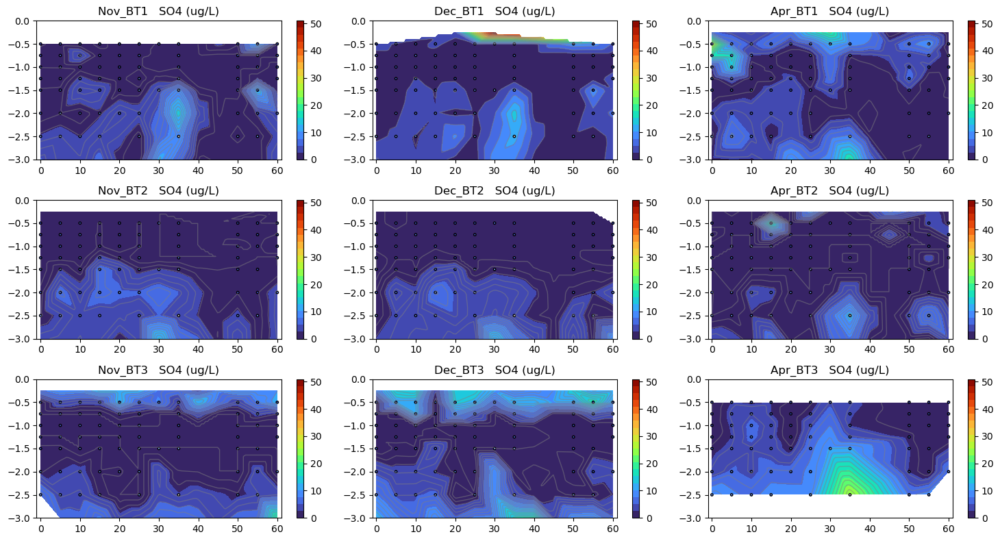

In [141]:
for parm in ['SO4']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 1, 10))
        cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 1, 10)])

        ax.set_title('{}   {} (ug/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\3859118943.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


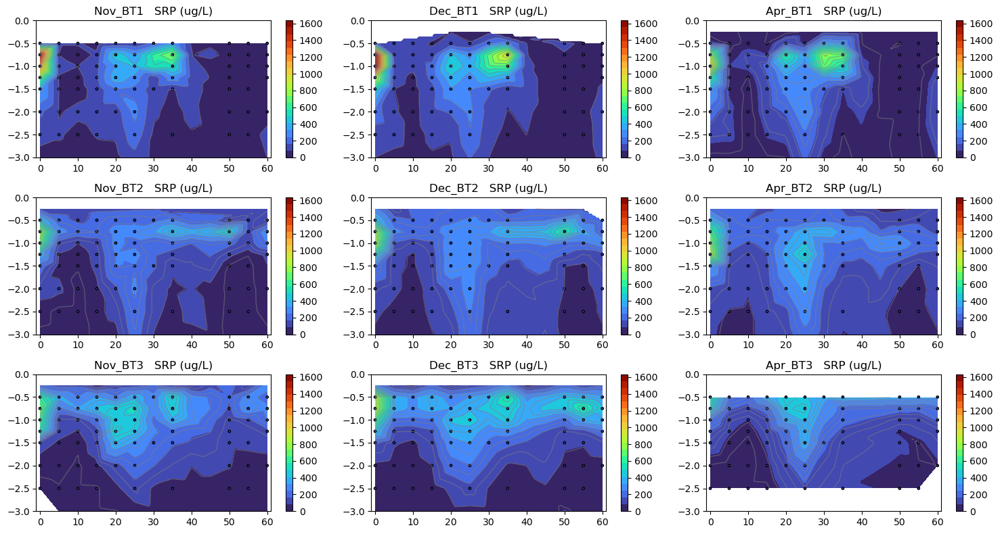

In [133]:
for parm in ['SRP']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 1, 200))
        cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 1, 200)])

        ax.set_title('{}   {} (ug/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\1157771648.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


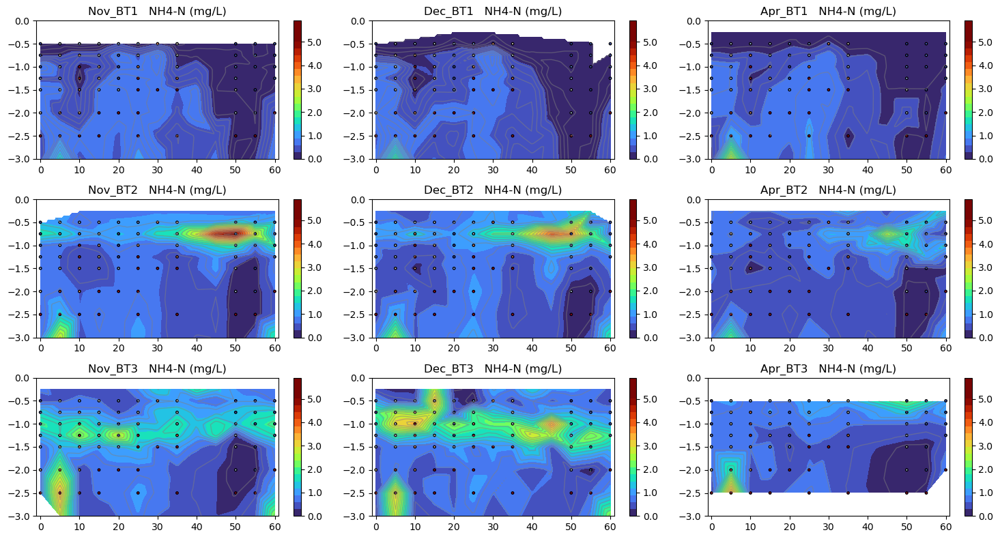

In [140]:
for parm in ['NH4-N']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax+0.9,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax+0.9)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 0.9, 1))
        cbar.set_ticklabels([i for i in np.arange(vmin, vmax + 0.9, 1)])

        ax.set_title('{}   {} (mg/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\1118164873.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


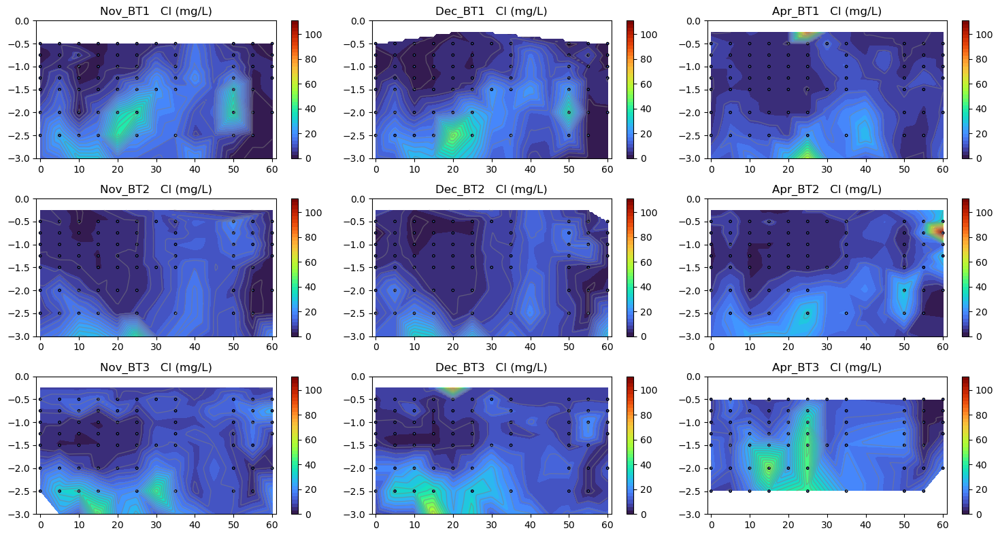

In [139]:
for parm in ['Cl']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax+0.9,20+20),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax+0.9)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 0.9, 20))
        cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 0.9, 20)])

        ax.set_title('{}   {} (mg/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\3441066695.py:41: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


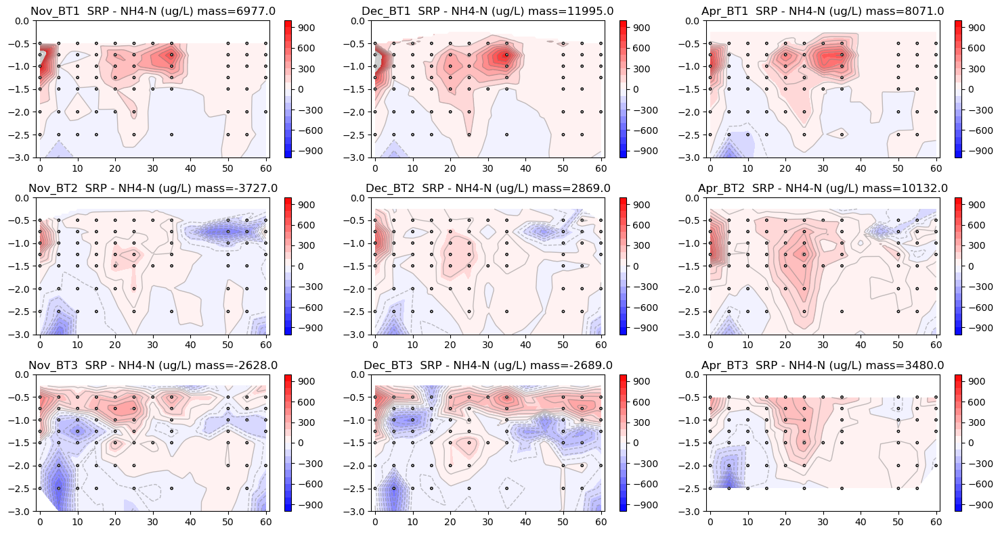

1959.0

C:\Users\swan47\AppData\Local\Temp\ipykernel_37244\4142146717.py:51: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\swan47\AppData\Local\Temp\ipykernel_37244\4142146717.py:114: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


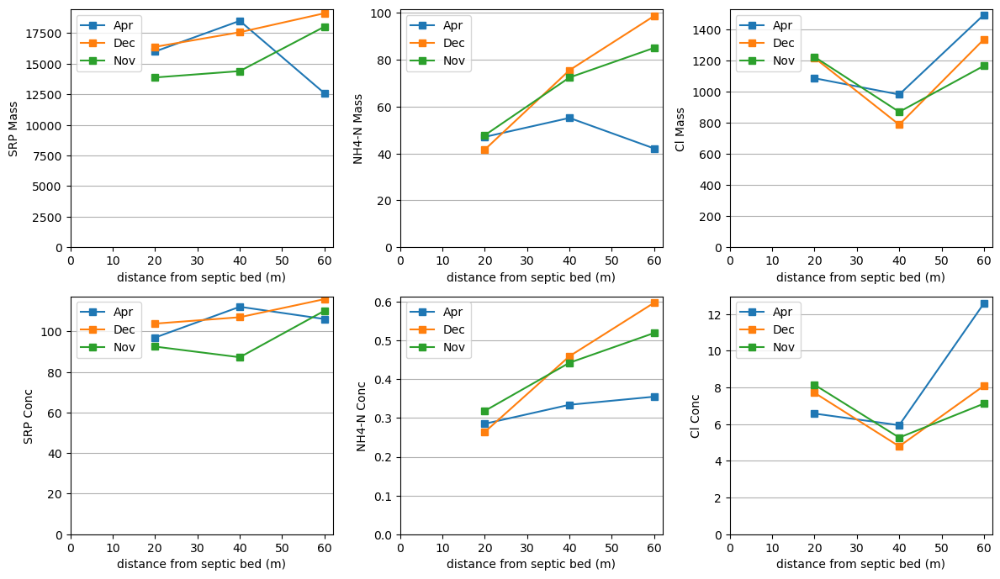

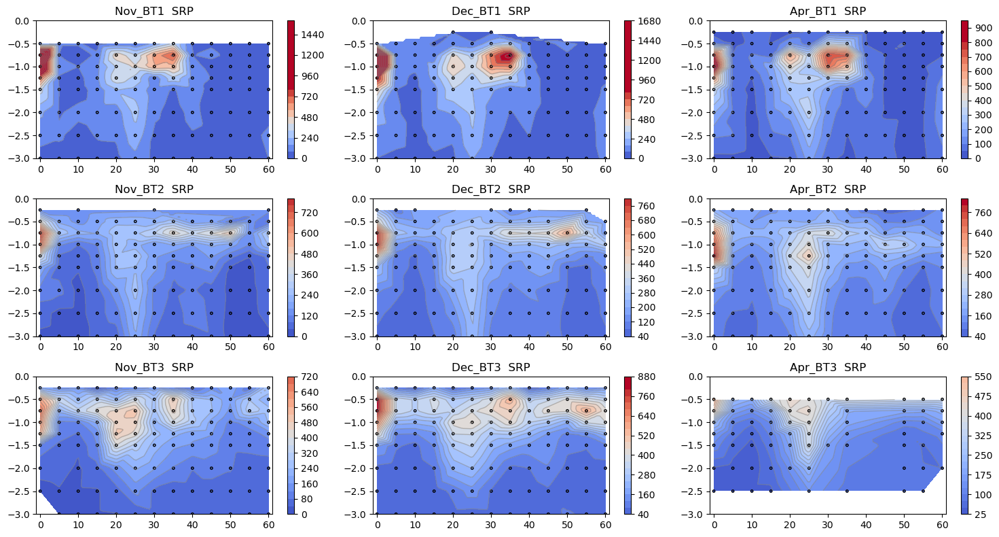

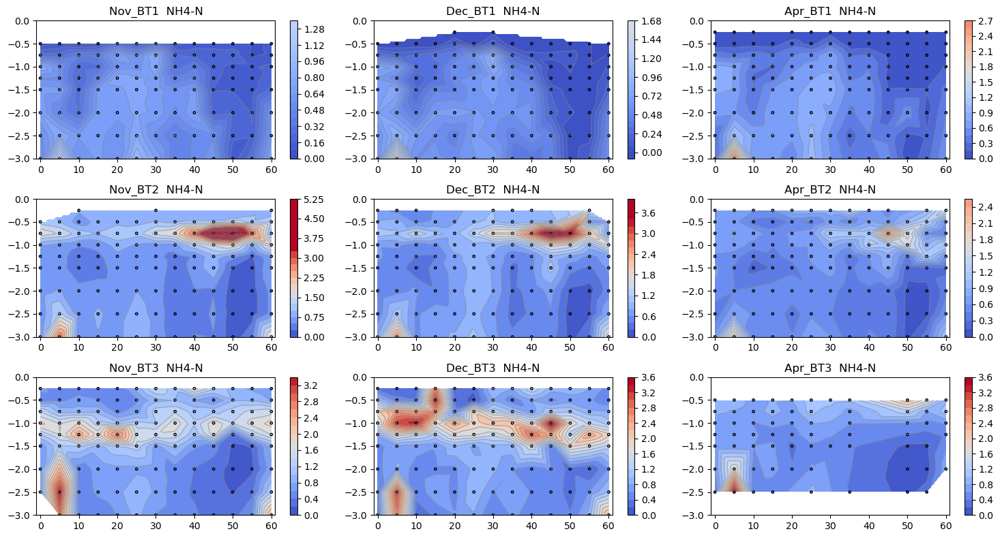

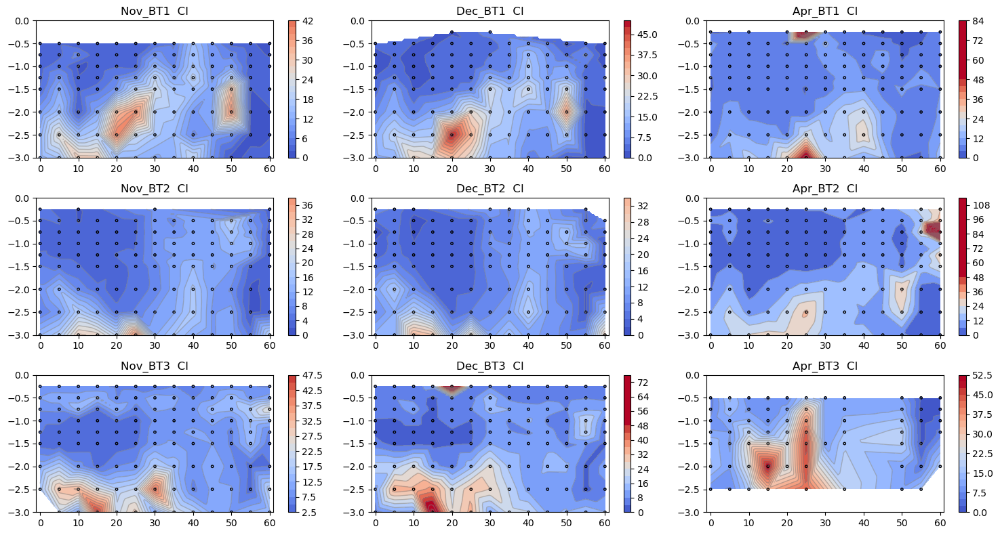

In [8]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,3)
n2 = 0

for parm in ['SRP', 'NH4-N','Cl','NO3','SO4']:
    vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax = np.nanpercentile([np.nanmax(raw_data[key][parm]) for key in raw_data.keys()],50)

    grid_zs ={}
    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:
        df1 = raw_data[sheet].copy()
        df1 = df1[~df1[parm].isna()]
        xs = df1['x']
        ys = df1['y']
        zs = df1[parm]


        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = griddata((xs, ys), zs, (grid_x, grid_y), method='linear')
        grid_zs[sheet] = grid_z


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='coolwarm',levels=20,vmin=vmin,vmax=vmax)
        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        plt.colorbar(contour)
        
        #ax.title('2D Cubic Interpolation')
        ax.set_title('{}  {}'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

    ##---------------------------------------


    ##---------------------------------------
    ax = ax2.flatten()[n2]
    
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:90]*0.025)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:90]*0.025)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:90]*0.025)

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))

    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+3]
    #n2 +=1
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:90]*0.025)/area
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:90]*0.025)/area


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:90]*0.025)/area

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(12,7)
fig2.tight_layout()
fig2.show()
    

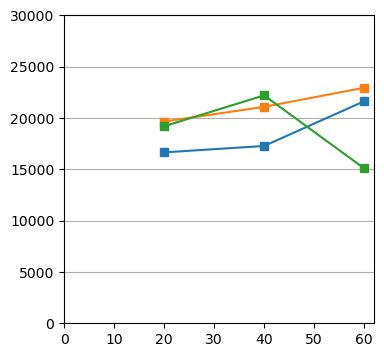

In [241]:
for month in ['Nov','Dec','Apr']:
    grid_z = grid_zs['{}_BT1'.format(month)]
    y1 = np.nansum(grid_z[:,20:45*2]*0.03)

    grid_z = grid_zs['{}_BT2'.format(month)]
    y2 = np.nansum(grid_z[:,20:45*2]*0.03)

    grid_z = grid_zs['{}_BT3'.format(month)]
    y3 = np.nansum(grid_z[:,20:45*2]*0.03)

    plt.plot([20,40,60],[y1,y2,y3],marker='s')
plt.ylim(0,30000)
plt.xlim(0)
plt.grid(axis='y')
plt.gcf().set_size_inches(4,4)
    

# Cations

In [53]:
cation_df = pd.read_excel('_imports/wasaga_cations.xlsx')
cation_df = cation_df[~cation_df['Fe'].isna()]

In [54]:
mask1 = cation_df['sample_name'].str.contains('BT1')
mask2 = cation_df['sample_name'].str.contains('BT2')
mask3 = cation_df['sample_name'].str.contains('BT3')

cation_df = cation_df[mask1 | mask2 |mask3]

In [55]:
cation_df.loc[:,'BT'] = cation_df['sample_name'].apply(lambda x: x.split('-')[1])


In [72]:
cation_df.loc[:,'x'] = cation_df['sample_name'].apply(lambda x: (int(x.split('-')[2])-1)*5)

In [93]:
cation_df.loc[:,'y'] = cation_df['sample_name'].apply(lambda x: x.split('-')[3])
cation_df.loc[:,'y'] = cation_df['y'].apply(lambda x: -float(x.split('m')[0]))

In [94]:
cation_df

,sample_code,sample_name,date_sampled,date_received,date_analysed,Unnamed: 5,Unnamed: 6,Al,Ca,Fe,K,Mg,Mn,Na,BT,y,x
45,20150972.0,CS5-BT3-1-2.5 m [B],2015-11-02,2015-11-03,2016-11-01,1.0,-0.055974,104.538040,NaN,6.058169,1.036964,14.041397,0.244007,11.605892,BT3,-2.5,0
47,20150973.0,CS5-BT3-1-2 m [C],2015-11-02,2015-11-03,2016-11-01,1.0,0.008089,121.800772,NaN,9.053136,1.126399,9.312114,0.420561,4.940276,BT3,-2.0,0
49,20150974.0,CS5-BT3-1-1.5 m [D],2015-11-02,2015-11-03,2016-11-01,1.0,-0.007064,113.877472,NaN,9.061127,1.413252,7.774407,0.519362,6.464600,BT3,-1.5,0
51,20150975.0,CS5-BT3-1-1.25 m [E],2015-11-02,2015-11-03,2016-11-01,1.0,-0.035882,164.633526,NaN,15.916233,1.951315,11.310076,0.805255,10.950208,BT3,-1.25,0
53,20150976.0,CS5-BT3-1-1 m [F],2015-11-02,2015-11-03,2016-11-01,1.0,-0.077083,175.497058,NaN,16.641990,2.185682,14.509478,0.968104,12.272101,BT3,-1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396,20151190.0,CS5-BT2-1-1.25 m [E],2015-11-04,2015-11-05,2017-02-24,1.0,-0.084678,139.485959,NaN,13.608287,1.329158,9.977747,0.526337,6.651667,BT2,-1.25,0
397,20151191.0,CS5-BT2-1-1 m [F],2015-11-04,2015-11-05,2017-02-24,1.0,-0.107576,153.173198,NaN,17.259724,0.985716,11.959447,0.583006,11.317458,BT2,-1.0,0
398,20151192.0,CS5-BT2-1-0.75 m [G],2015-11-04,2015-11-05,2017-02-24,1.0,-0.118893,173.863407,NaN,21.372588,0.906409,13.773754,0.716819,16.973218,BT2,-0.75,0
399,20151193.0,CS5-BT2-1-0.50 m [H],2015-11-04,2015-11-05,2017-02-24,1.0,-0.121097,178.886272,NaN,23.126858,0.805453,14.678979,0.726827,23.488789,BT2,-0.5,0


array(['BT3', 'BT2'], dtype=object)

In [145]:
cation_df['Ca']

45    NaN
47    NaN
49    NaN
51    NaN
53    NaN
       ..
396   NaN
397   NaN
398   NaN
399   NaN
400   NaN
Name: Ca, Length: 226, dtype: float64

'0.5'

5.0

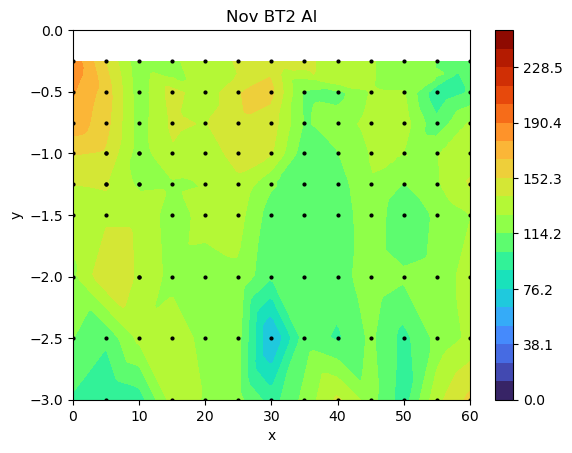

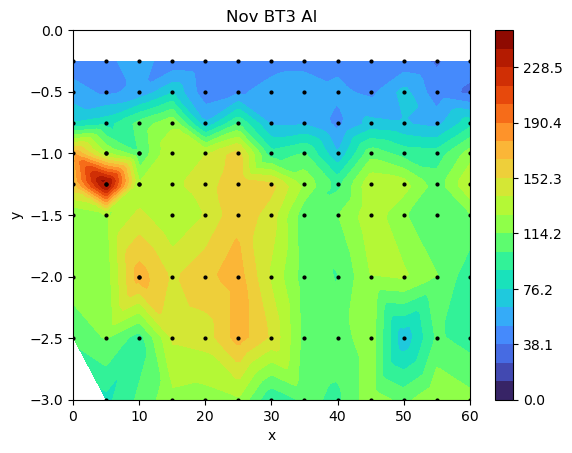

----------


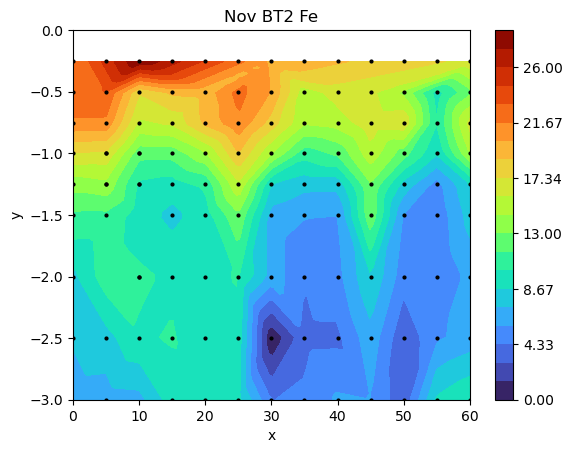

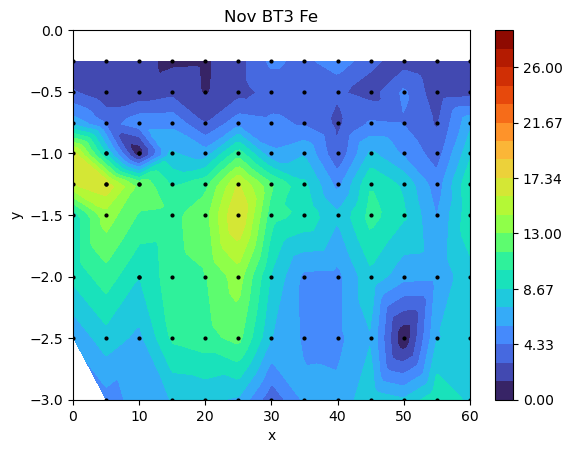

----------


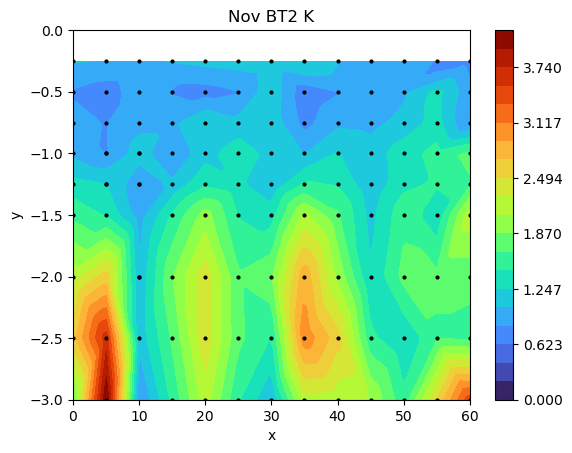

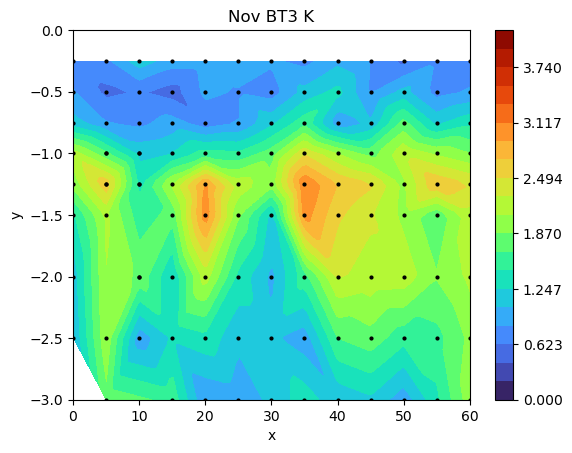

----------


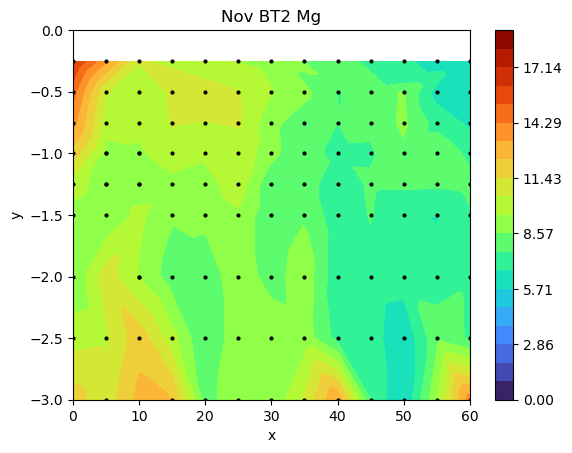

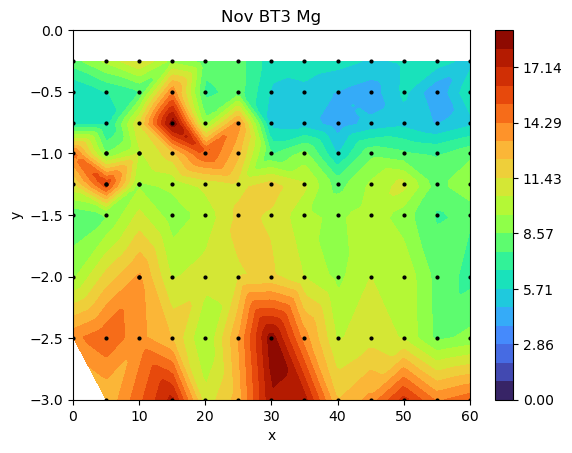

----------


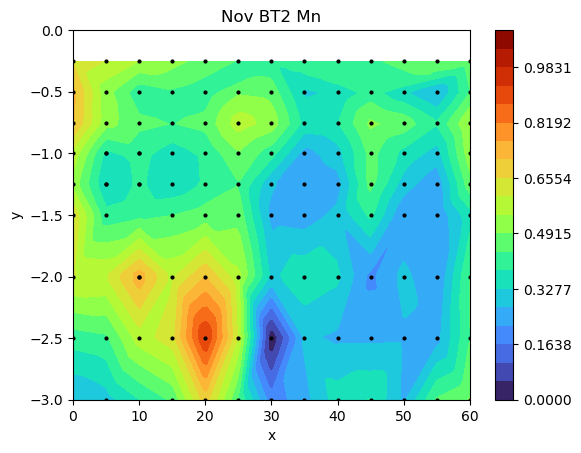

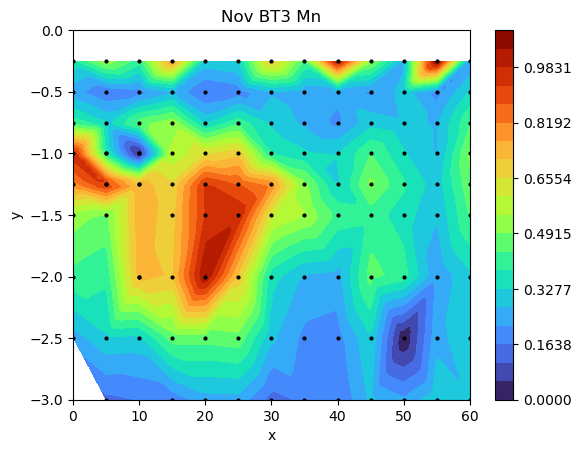

----------


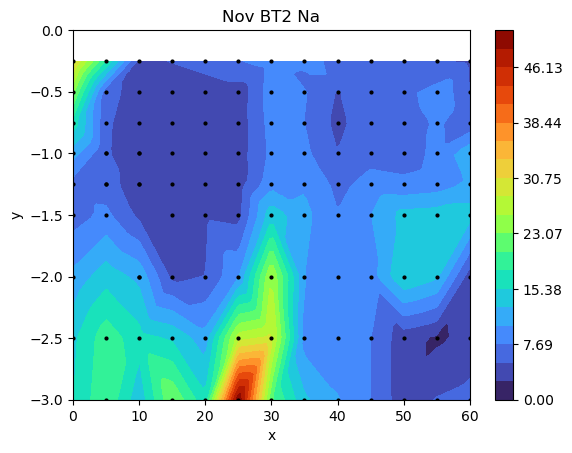

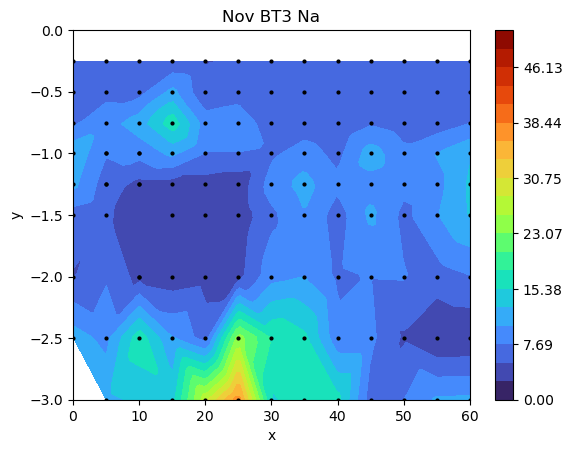

----------


In [171]:
from scipy.interpolate import griddata

for parm in ['Al','Fe','K','Mg','Mn','Na']:
    vmin = 0
    vmax = cation_df[parm].quantile(1)
    for bt in ['BT2','BT3']:
        df0 = cation_df[cation_df['BT']==bt]

        xs = df0['x']
        ys = df0['y']
        zs = df0[parm]
        
        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))
        grid_z = griddata((xs, ys), zs, (grid_x, grid_y), method='linear')

        # Create a contour plot
        #plt.tricontourf(x, y, z,cmap='turbo')
        plt.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)

 
        #
        cbar = plt.colorbar() 
        gap  = float("{0:.1g}".format((vmax-vmin)/12))
        #cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 1, gap)])


        plt.scatter(x,y,c='k',s=4) 
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('Nov {} {}'.format(bt,parm))
        plt.ylim(-3,0)

        plt.show()
    print('----------')

In [170]:
[int(i) for i in np.arange(vmin, vmax + 1, gap)]

[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240]